<a href="https://colab.research.google.com/github/varunbhaisare23/Cogniyz-Internship/blob/main/DataAnalyticsCOGNIFYZ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd

# Load the dataset
# Since the CSV is in the same folder, we just use the filename
df = pd.read_csv('/Dataset .csv')

# Show the first 5 rows to make sure it loaded correctly
df.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
import pandas as pd

# 1. Load the data
df = pd.read_csv('/Dataset .csv')

# 2. Identify the Target Variable
# The task asks us to predict 'Aggregate rating', so that is our target (y).
target = 'Aggregate rating'
print(f"Target Variable identified: {target}")

# 3. Check for Missing Values
# This shows how many empty spots are in each column
missing_values = df.isnull().sum()
print("\nMissing values in each column:")
print(missing_values[missing_values > 0])

# 4. Handle Missing Values
# If 'Cuisines' has missing values (common in this dataset), we fill them with 'Unknown'
df['Cuisines'] = df['Cuisines'].fillna('Unknown')

# 5. Data Type Conversion
# Let's ensure the 'Aggregate rating' is a decimal (float) and 'Votes' is an integer
df['Aggregate rating'] = df['Aggregate rating'].astype(float)
df['Votes'] = df['Votes'].astype(int)

# 6. Final Check
print("\nData distribution of the target variable:")
print(df['Aggregate rating'].describe())

Target Variable identified: Aggregate rating

Missing values in each column:
Cuisines    9
dtype: int64

Data distribution of the target variable:
count    9551.000000
mean        2.666370
std         1.516378
min         0.000000
25%         2.500000
50%         3.200000
75%         3.700000
max         4.900000
Name: Aggregate rating, dtype: float64


In [ ]:
# 1. Get all cuisines, skipping any empty (null) values
cuisine_data = df['Cuisines'].dropna()

# 2. Split the comma-separated strings into a single list of all cuisines
all_cuisines = []
for cuisines in cuisine_data:
    # .split(',') breaks "French, Japanese" into ["French", " Japanese"]
    # .strip() removes the extra space so " Japanese" becomes "Japanese"
    all_cuisines.extend([c.strip() for c in cuisines.split(',')])

# 3. Convert the list to a Series and count the top 3
top_3_cuisines = pd.Series(all_cuisines).value_counts().head(3)

print("The Top 3 Most Common Cuisines are:")
print(top_3_cuisines)

The Top 3 Most Common Cuisines are:
North Indian    3960
Chinese         2735
Fast Food       1986
Name: count, dtype: int64


In [ ]:
# 1. Calculate the total number of restaurants in the dataset
total_restaurants = len(df)

# 2. We already know our top 3 cuisines from the previous step
top_cuisines = ['North Indian', 'Chinese', 'Fast Food']

print(f"Total Restaurants in Dataset: {total_restaurants}\n")

# 3. Calculate and print the percentage for each
for cuisine in top_cuisines:
    # We count a restaurant if the cuisine name is inside its 'Cuisines' string
    # We use a lambda function to split the string and check for an exact match
    count = df['Cuisines'].dropna().apply(lambda x: cuisine in [c.strip() for c in x.split(',')]).sum()

    percentage = (count / total_restaurants) * 100

    print(f"{cuisine}:")
    print(f" - Number of Restaurants: {count}")
    print(f" - Percentage: {percentage:.2f}%\n")

Total Restaurants in Dataset: 9551

North Indian:
 - Number of Restaurants: 3960
 - Percentage: 41.46%

Chinese:
 - Number of Restaurants: 2733
 - Percentage: 28.61%

Fast Food:
 - Number of Restaurants: 1986
 - Percentage: 20.79%



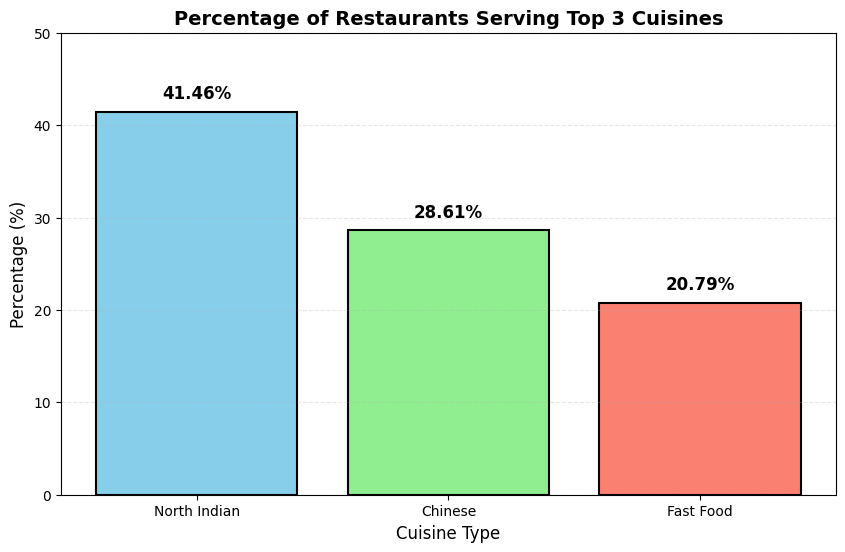

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. Prepare the data (calculated from previous steps)
cuisines = ['North Indian', 'Chinese', 'Fast Food']
percentages = [41.46, 28.61, 20.79]

# 2. Create the plot
plt.figure(figsize=(10, 6))

# Use edgecolor='black' for the sharp borders you requested
# linewidth=1.5 makes the borders stand out more
bars = plt.bar(cuisines, percentages, color=['skyblue', 'lightgreen', 'salmon'],
               edgecolor='black', linewidth=1.5)

# 3. Add exact percentage labels on top of each bar for "precision"
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1, f'{yval}%',
             ha='center', va='bottom', fontweight='bold', fontsize=12)

# 4. Add titles and labels
plt.title('Percentage of Restaurants Serving Top 3 Cuisines', fontsize=14, fontweight='bold')
plt.xlabel('Cuisine Type', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)

# Adjust the Y-axis limit to make room for the labels
plt.ylim(0, 50)

# 5. Show and Save
plt.grid(axis='y', linestyle='--', alpha=0.3) # Adds light grid lines for readability
plt.savefig('cuisine_percentage_precise.png')
plt.show()

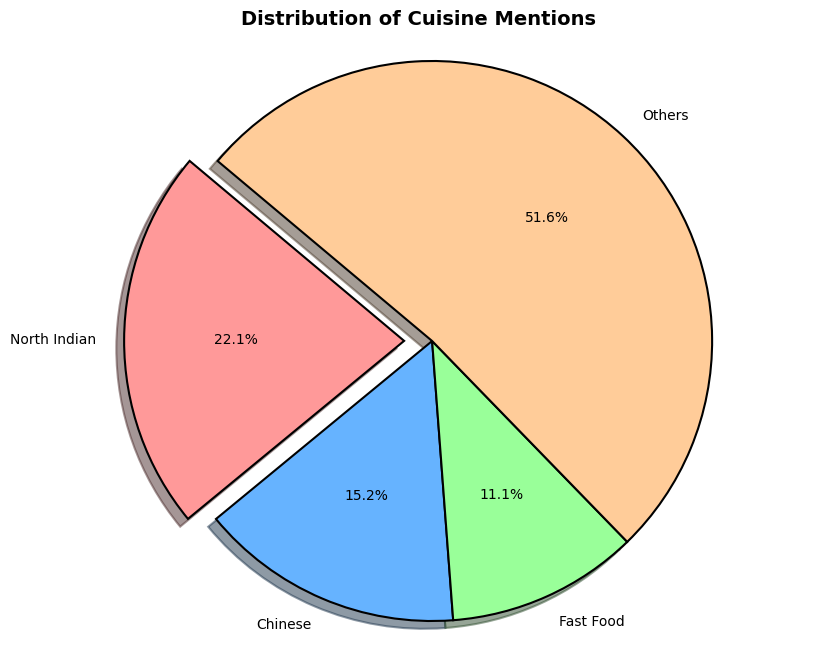

In [ ]:
import matplotlib.pyplot as plt

# 1. Prepare the data
# We take the counts of the top 3 and group the rest as 'Others'
top_3_counts = [3960, 2733, 1986]
others_count = 9260  # This represents the sum of all other cuisine mentions
labels = ['North Indian', 'Chinese', 'Fast Food', 'Others']
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']

# 2. Create the Pie Chart
plt.figure(figsize=(10, 8))

# 'explode' pulls the first slice (North Indian) out slightly for emphasis
explode = (0.1, 0, 0, 0)

# autopct='%1.1f%%' shows the percentage inside the slices
plt.pie(top_3_counts + [others_count],
        labels=labels,
        autopct='%1.1f%%',
        startangle=140,
        colors=colors,
        explode=explode,
        shadow=True,
        wedgeprops={'edgecolor': 'black', 'linewidth': 1.5})

# 3. Final touches
plt.title('Distribution of Cuisine Mentions', fontsize=14, fontweight='bold')
plt.axis('equal')  # Ensures the pie is a perfect circle

# 4. Save and Show
plt.savefig('cuisine_pie_chart.png')
plt.show()

# **CITY ANALYSIS**

1. City with the most restaurants: New Delhi (5473 restaurants)
2. City with the highest average rating: Inner City (4.90 avg rating)


/tmp/ipython-input-699051142.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=city_counts.head(10).index, y=city_counts.head(10).values, palette='viridis', edgecolor='black')


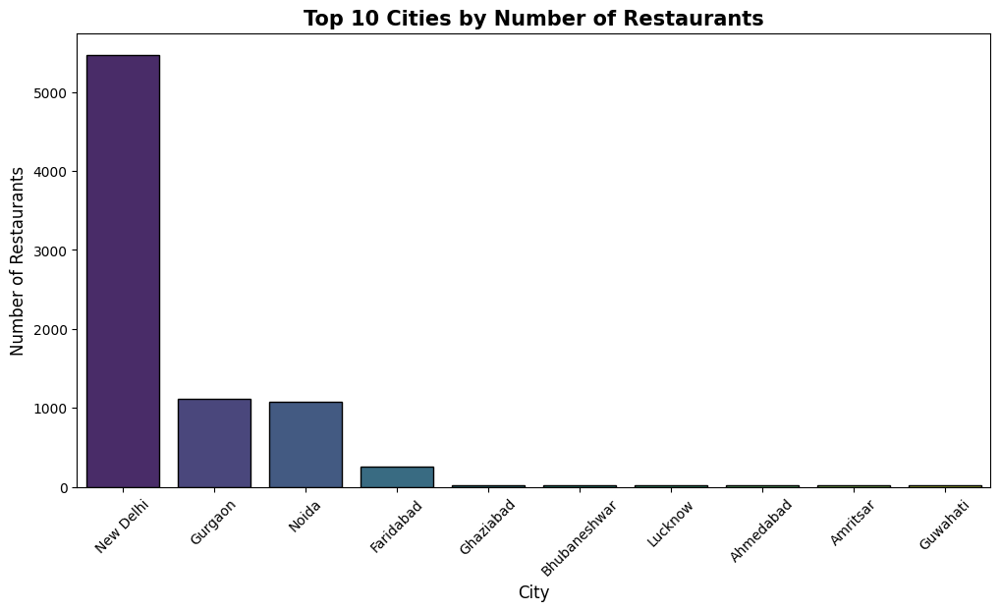

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Identify the city with the highest number of restaurants
city_counts = df['City'].value_counts()
top_city = city_counts.index[0]
top_count = city_counts.values[0]

print(f"1. City with the most restaurants: {top_city} ({top_count} restaurants)")

# 2. Calculate the average rating for each city
city_avg_rating = df.groupby('City')['Aggregate rating'].mean()

# 3. Identify the city with the highest average rating
best_rated_city = city_avg_rating.idxmax()
best_rating_value = city_avg_rating.max()

print(f"2. City with the highest average rating: {best_rated_city} ({best_rating_value:.2f} avg rating)")

# 4. Visualization: Top 10 Cities by Restaurant Count
plt.figure(figsize=(12, 6))
sns.barplot(x=city_counts.head(10).index, y=city_counts.head(10).values, palette='viridis', edgecolor='black')

plt.title('Top 10 Cities by Number of Restaurants', fontsize=15, fontweight='bold')
plt.xlabel('City', fontsize=12)
plt.ylabel('Number of Restaurants', fontsize=12)
plt.xticks(rotation=45) # Rotates city names so they don't overlap
plt.show()

In [ ]:
import pandas as pd

# Load the data
df = pd.read_csv('/Dataset .csv')

# Count restaurants per city
city_counts = df['City'].value_counts()

# Get the top city
top_city = city_counts.idxmax()
count = city_counts.max()

print(f"The city with the highest number of restaurants is: {top_city}")
print(f"Total Restaurants: {count}")

# Optional: Show the top 5 cities
print("\nTop 5 Cities:")
print(city_counts.head(5))

The city with the highest number of restaurants is: New Delhi
Total Restaurants: 5473

Top 5 Cities:
City
New Delhi    5473
Gurgaon      1118
Noida        1080
Faridabad     251
Ghaziabad      25
Name: count, dtype: int64


In [ ]:
import pandas as pd

# Load the data
df = pd.read_csv('/Dataset .csv')

# Group by City and calculate the average rating
city_averages = df.groupby('City')['Aggregate rating'].mean()

# Sort them from highest to lowest to see the best performing cities first
city_averages_sorted = city_averages.sort_values(ascending=False)

print("Average Rating per City (Top 10):")
print(city_averages_sorted.head(10))

Average Rating per City (Top 10):
City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
Beechworth          4.600000
London              4.535000
Taguig City         4.525000
Secunderabad        4.500000
Lincoln             4.500000
Name: Aggregate rating, dtype: float64


In [ ]:
import pandas as pd

# Load the data
df = pd.read_csv('/Dataset .csv')

# Calculate average rating per city
city_avg_rating = df.groupby('City')['Aggregate rating'].mean()

# Find the city with the highest average
best_city = city_avg_rating.idxmax()
highest_rating = city_avg_rating.max()

print(f"The city with the highest average rating is: {best_city}")
print(f"Average Rating: {highest_rating:.2f}")

The city with the highest average rating is: Inner City
Average Rating: 4.90


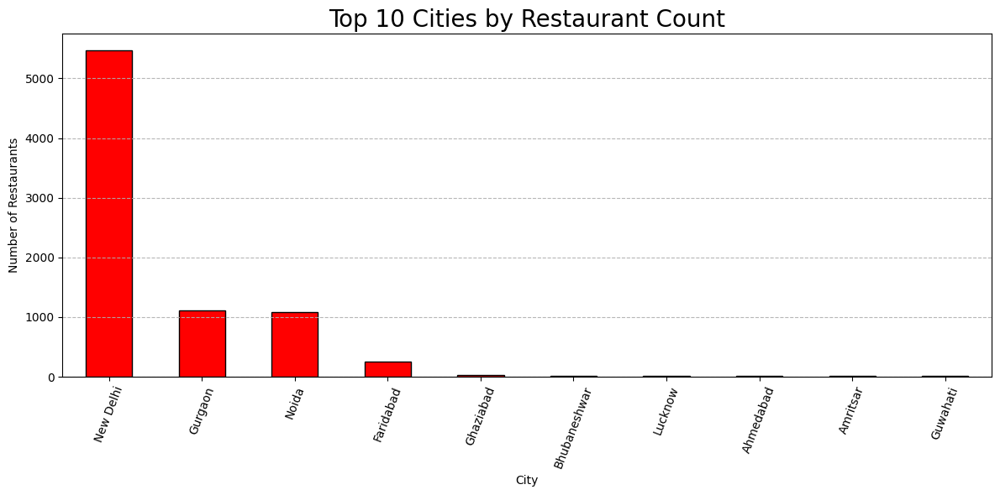

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('/Dataset .csv')

# Get top 10 cities
top_10_cities = df['City'].value_counts().head(10)

# Create the bar chart
plt.figure(figsize=(12, 6))
top_10_cities.plot(kind='bar', color='red', edgecolor='black')

plt.title('Top 10 Cities by Restaurant Count', fontsize=20)
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=69)
plt.grid(axis='y', linestyle='--', alpha=0.9)

plt.tight_layout()
plt.show()

# **PRICE RANGE DISTRIBUTION**

/tmp/ipython-input-1159676112.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('viridis', 10)(range(10)) # Eye-catching gradient


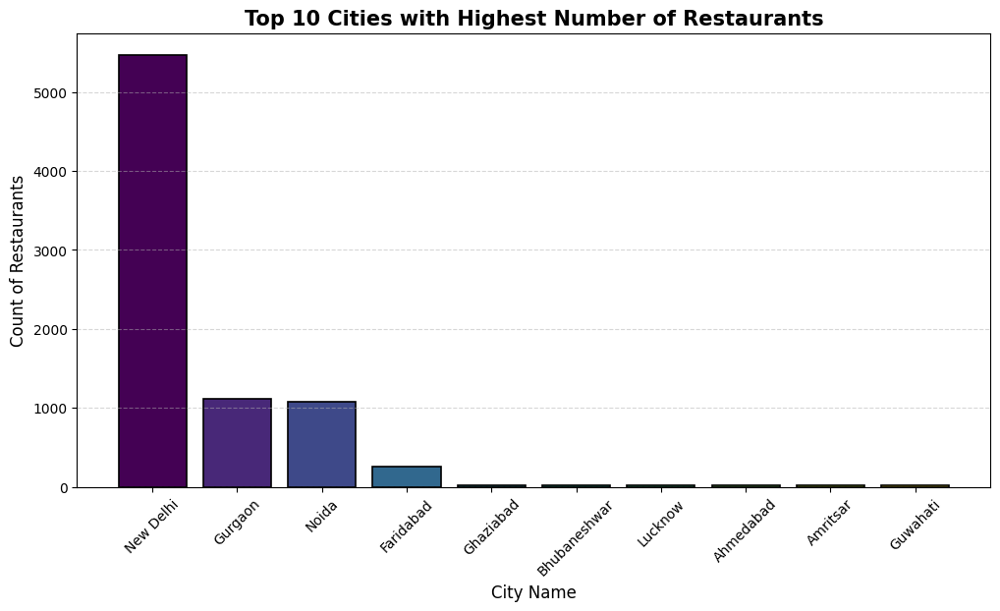

The city with the most restaurants is New Delhi with 5473 entries.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv('/Dataset .csv')

# Get top 10 cities for a better visual
city_counts = df['City'].value_counts().head(10)

# Create the plot
plt.figure(figsize=(12, 6))
colors = plt.cm.get_cmap('viridis', 10)(range(10)) # Eye-catching gradient

plt.bar(city_counts.index, city_counts.values, color=colors, edgecolor='black', linewidth=1.2)

# Adding labels
plt.title('Top 10 Cities with Highest Number of Restaurants', fontsize=15, fontweight='bold')
plt.xlabel('City Name', fontsize=12)
plt.ylabel('Count of Restaurants', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()

print(f"The city with the most restaurants is {city_counts.idxmax()} with {city_counts.max()} entries.")


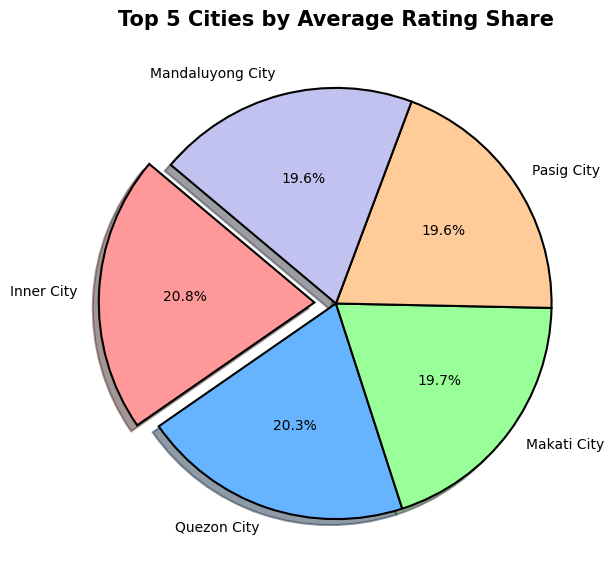

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate average rating per city
city_avg = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).head(5)

# Create an eye-catching Pie Chart
plt.figure(figsize=(10, 7))
explode = (0.1, 0, 0, 0, 0)  # "Explode" the top city
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0']

plt.pie(city_avg, labels=city_avg.index, autopct='%1.1f%%', startangle=140,
        colors=colors, explode=explode, shadow=True,
        wedgeprops={'edgecolor': 'black', 'linewidth': 1.5})

plt.title('Top 5 Cities by Average Rating Share', fontsize=15, fontweight='bold')
plt.show()

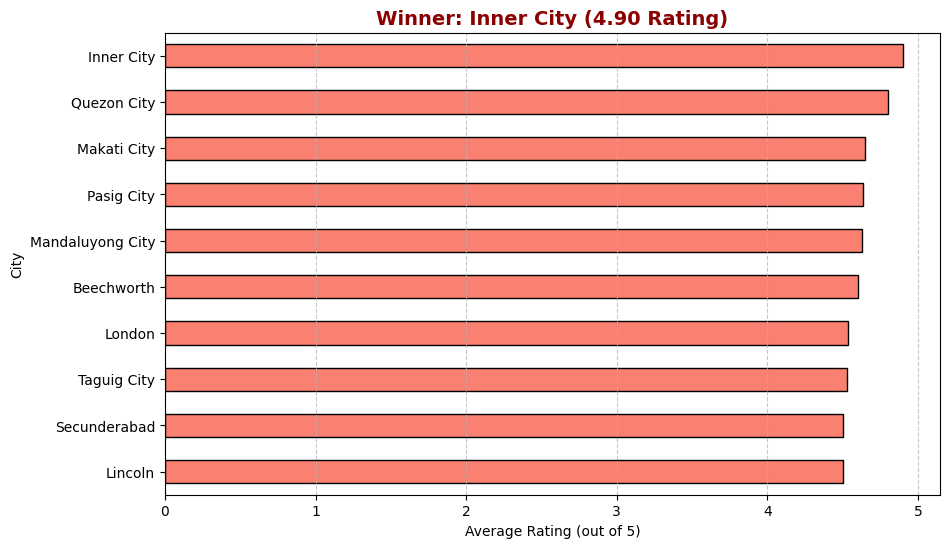

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate averages
city_avg_rating = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).head(10)

# Create a Horizontal Bar Chart (Histogram)
plt.figure(figsize=(10, 6))
city_avg_rating.plot(kind='barh', color='salmon', edgecolor='black')

# Precise label on the winner
winner = city_avg_rating.idxmax()
value = city_avg_rating.max()

plt.title(f'Winner: {winner} ({value:.2f} Rating)', fontsize=14, color='darkred', fontweight='bold')
plt.xlabel('Average Rating (out of 5)')
plt.ylabel('City')
plt.gca().invert_yaxis() # Highest rating at the top
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.show()

In [ ]:
import pandas as pd

# 1. Load your dataset
df = pd.read_csv('/Dataset .csv')

# 2. Calculate the count of restaurants in each price range
price_counts = df['Price range'].value_counts()

# 3. Calculate the percentage of restaurants in each price range
# normalize=True gives proportions (0 to 1), multiplying by 100 gives percentages
price_percentages = df['Price range'].value_counts(normalize=True) * 100

# 4. Combine counts and percentages into a clean table (DataFrame)
price_analysis = pd.DataFrame({
    'Count': price_counts,
    'Percentage (%)': price_percentages
})

# Sort by Price Range (1, 2, 3, 4)
price_analysis = price_analysis.sort_index()

print("Price Range Category Analysis:")
print(price_analysis)

# To see the total number of restaurants for context
print(f"\nTotal Restaurants Analyzed: {len(df)}")

Price Range Category Analysis:
             Count  Percentage (%)
Price range                       
1             4444       46.529159
2             3113       32.593446
3             1408       14.741912
4              586        6.135483

Total Restaurants Analyzed: 9551


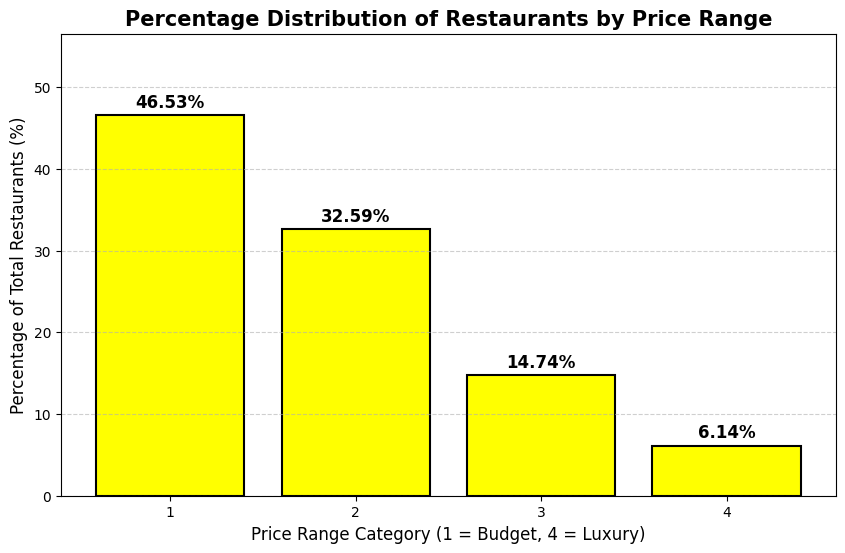

In [ ]:
import matplotlib.pyplot as plt

# Create the plot
plt.figure(figsize=(10, 6))

# Use the data calculated above
bars = plt.bar(price_analysis.index.astype(str), price_analysis['Percentage (%)'],
               color='yellow', edgecolor='black', linewidth=1.5)

# Add exact percentage labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.5,
             f'{height:.2f}%', ha='center', va='bottom', fontweight='bold', fontsize=12)

# Styling
plt.title('Percentage Distribution of Restaurants by Price Range', fontsize=15, fontweight='bold')
plt.xlabel('Price Range Category (1 = Budget, 4 = Luxury)', fontsize=12)
plt.ylabel('Percentage of Total Restaurants (%)', fontsize=12)
plt.ylim(0, max(price_analysis['Percentage (%)']) + 10) # Add space for labels
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.show()

# **ONLINE DELIVERY**

Online Delivery Summary:
Has Online delivery
No     74.337766
Yes    25.662234
Name: proportion, dtype: float64


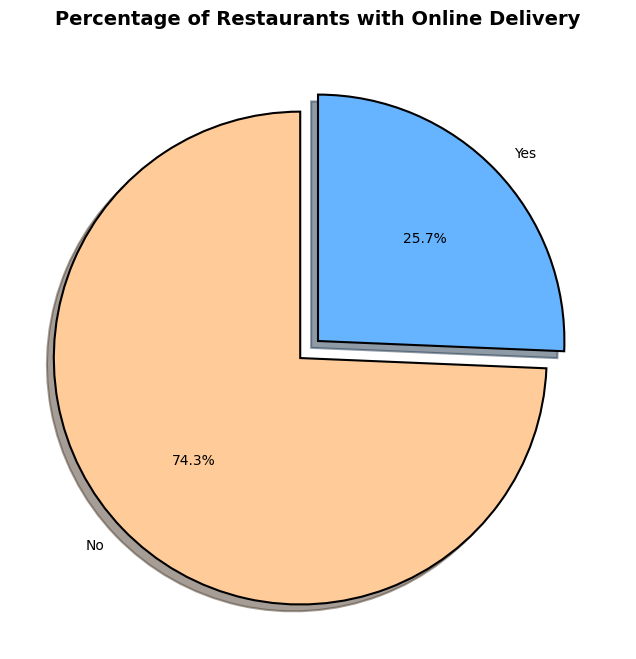

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv('/Dataset .csv')

# Calculate counts and percentages
delivery_counts = df['Has Online delivery'].value_counts()
delivery_pct = df['Has Online delivery'].value_counts(normalize=True) * 100

print("Online Delivery Summary:")
print(delivery_pct)

# Visualization: Pie Chart
plt.figure(figsize=(8, 8))
colors = ['#ffcc99', '#66b3ff'] # Soft orange for 'No', Soft blue for 'Yes'
explode = (0.1, 0) # Pull out the 'No' slice for emphasis

plt.pie(delivery_counts, labels=delivery_counts.index, autopct='%1.1f%%',
        startangle=90, colors=colors, explode=explode, shadow=True,
        wedgeprops={'edgecolor': 'black', 'linewidth': 1.5})

plt.title('Percentage of Restaurants with Online Delivery', fontsize=14, fontweight='bold')
plt.show()

Average Ratings Comparison:
Has Online delivery
No     2.465296
Yes    3.248837
Name: Aggregate rating, dtype: float64


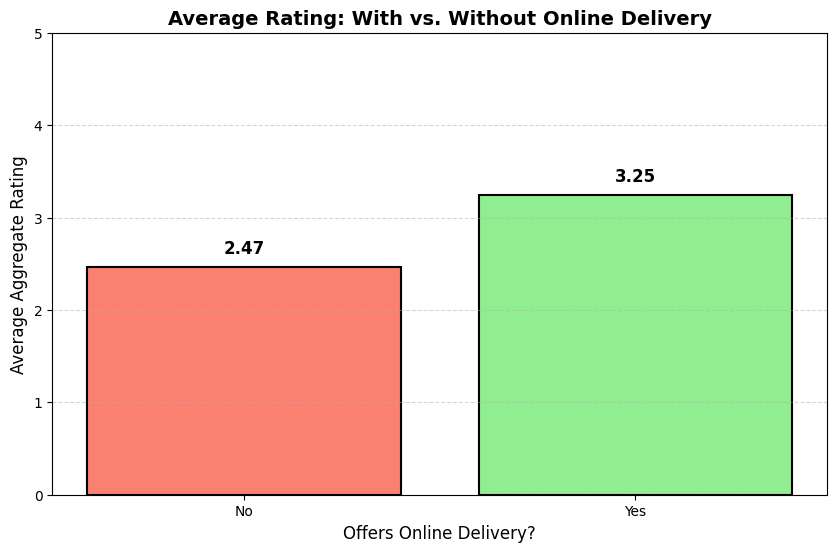

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Group by 'Has Online delivery' and calculate average 'Aggregate rating'
avg_ratings = df.groupby('Has Online delivery')['Aggregate rating'].mean()

print("Average Ratings Comparison:")
print(avg_ratings)

# Visualization: Bar Chart
plt.figure(figsize=(10, 6))
bars = plt.bar(avg_ratings.index, avg_ratings.values, color=['salmon', 'lightgreen'],
               edgecolor='black', linewidth=1.5)

# Add precise rating labels on top
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, f'{yval:.2f}',
             ha='center', va='bottom', fontweight='bold', fontsize=12)

plt.title('Average Rating: With vs. Without Online Delivery', fontsize=14, fontweight='bold')
plt.xlabel('Offers Online Delivery?', fontsize=12)
plt.ylabel('Average Aggregate Rating', fontsize=12)
plt.ylim(0, 5) # Rating scale
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()

# **RESTAURENT RATINGS**

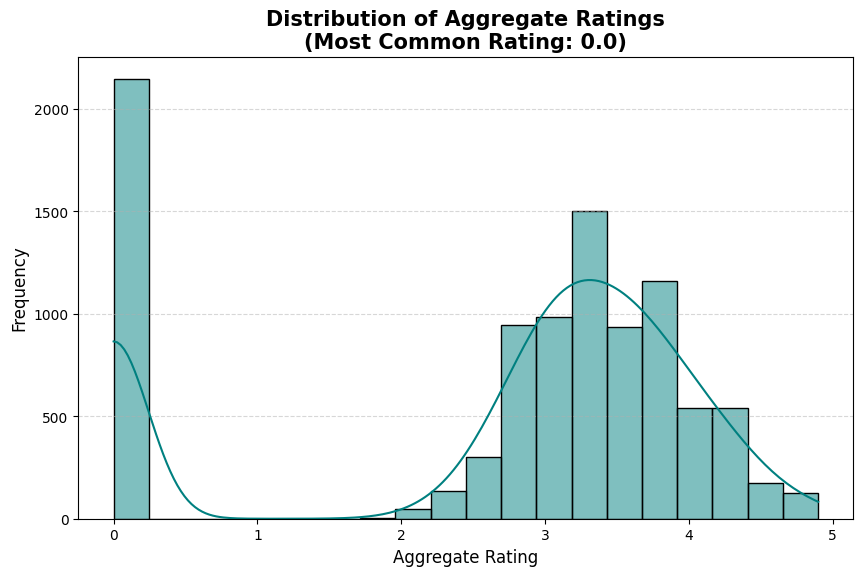

The most common specific rating in the dataset is: 0.0


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv('/Dataset .csv')

# 1. Analyze the distribution
plt.figure(figsize=(10, 6))
sns.histplot(df['Aggregate rating'], bins=20, kde=True, color='teal', edgecolor='black')

# 2. Determine the most common rating range
# We use value_counts on a rounded version to see the common "whole" or "half" numbers
common_range = df['Aggregate rating'].mode()[0]

plt.title(f'Distribution of Aggregate Ratings\n(Most Common Rating: {common_range})', fontsize=15, fontweight='bold')
plt.xlabel('Aggregate Rating', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()

print(f"The most common specific rating in the dataset is: {common_range}")

The average number of votes received by restaurants is: 156.91


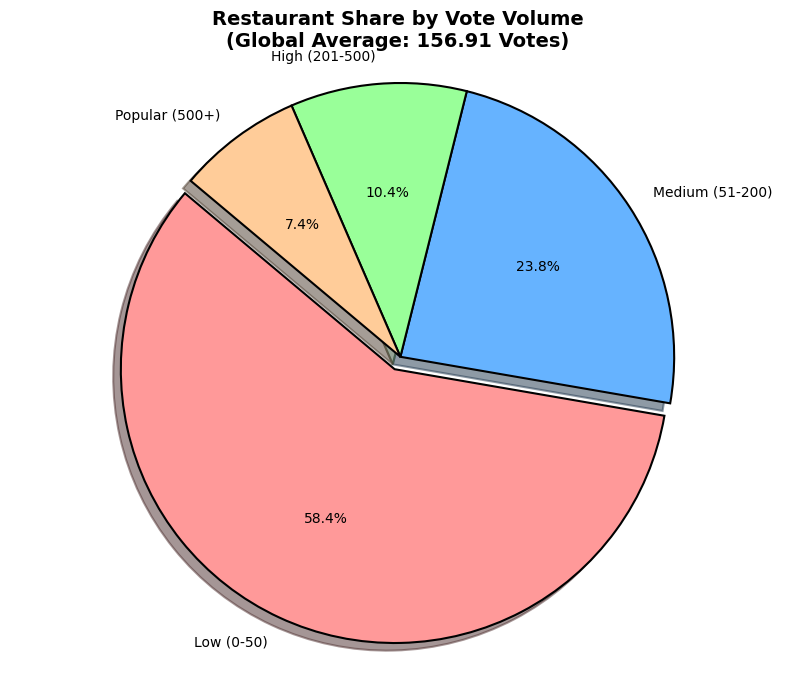


Number of restaurants per category:
Vote Category
Low (0-50)         5577
Medium (51-200)    2275
High (201-500)      994
Popular (500+)      705
Name: count, dtype: int64


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load your dataset
df = pd.read_csv('/Dataset .csv')

# 2. Calculate the average number of votes
avg_votes = df['Votes'].mean()
print(f"The average number of votes received by restaurants is: {avg_votes:.2f}")

# 3. Prepare data for the Pie Chart
# We create 'bins' to group restaurants by how many votes they have
bins = [0, 50, 200, 500, 15000] # Defining ranges
labels = ['Low (0-50)', 'Medium (51-200)', 'High (201-500)', 'Popular (500+)']
df['Vote Category'] = pd.cut(df['Votes'], bins=bins, labels=labels, include_lowest=True)

# Count how many restaurants fall into each category
vote_counts = df['Vote Category'].value_counts()

# 4. Create an eye-catching Pie Chart
plt.figure(figsize=(10, 8))
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
explode = (0.05, 0, 0, 0) # Slightly separate the largest slice

plt.pie(vote_counts, labels=vote_counts.index, autopct='%1.1f%%',
        startangle=140, colors=colors, explode=explode, shadow=True,
        wedgeprops={'edgecolor': 'black', 'linewidth': 1.5})

# Add a title that includes the average
plt.title(f'Restaurant Share by Vote Volume\n(Global Average: {avg_votes:.2f} Votes)',
          fontsize=14, fontweight='bold')

plt.axis('equal') # Keep the pie round
plt.show()

# Optional: Display the raw counts
print("\nNumber of restaurants per category:")
print(vote_counts)

# **Cuisine Combination**

/tmp/ipython-input-1568047637.py:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('spring')(range(10)) # Bright, eye-catching colors


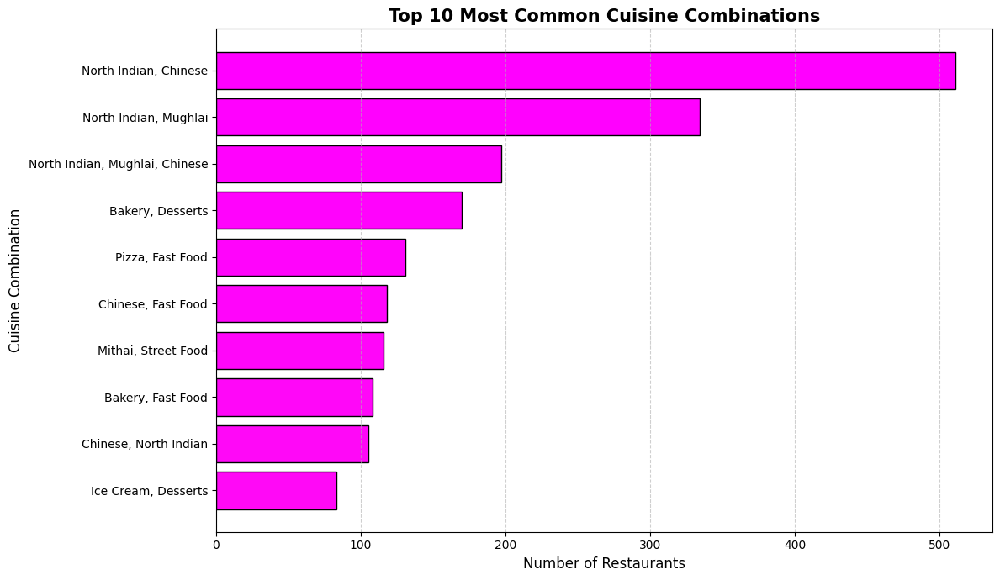

Top 5 Combinations:
Cuisines
North Indian, Chinese             511
North Indian, Mughlai             334
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Pizza, Fast Food                  131
Name: count, dtype: int64


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('/Dataset .csv')

# 1. Filter out restaurants that only serve ONE cuisine
# We only want combinations, so we look for rows with a comma
combinations = df[df['Cuisines'].str.contains(',', na=False)]

# 2. Count the most frequent combinations
top_combinations = combinations['Cuisines'].value_counts().head(10)

# 3. Create an eye-catching Horizontal Bar Chart
plt.figure(figsize=(12, 7))
colors = plt.cm.get_cmap('spring')(range(10)) # Bright, eye-catching colors

plt.barh(top_combinations.index, top_combinations.values, color=colors, edgecolor='black')

plt.title('Top 10 Most Common Cuisine Combinations', fontsize=15, fontweight='bold')
plt.xlabel('Number of Restaurants', fontsize=12)
plt.ylabel('Cuisine Combination', fontsize=12)
plt.gca().invert_yaxis() # Put the #1 combo at the top
plt.grid(axis='x', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

print("Top 5 Combinations:")
print(top_combinations.head(5))

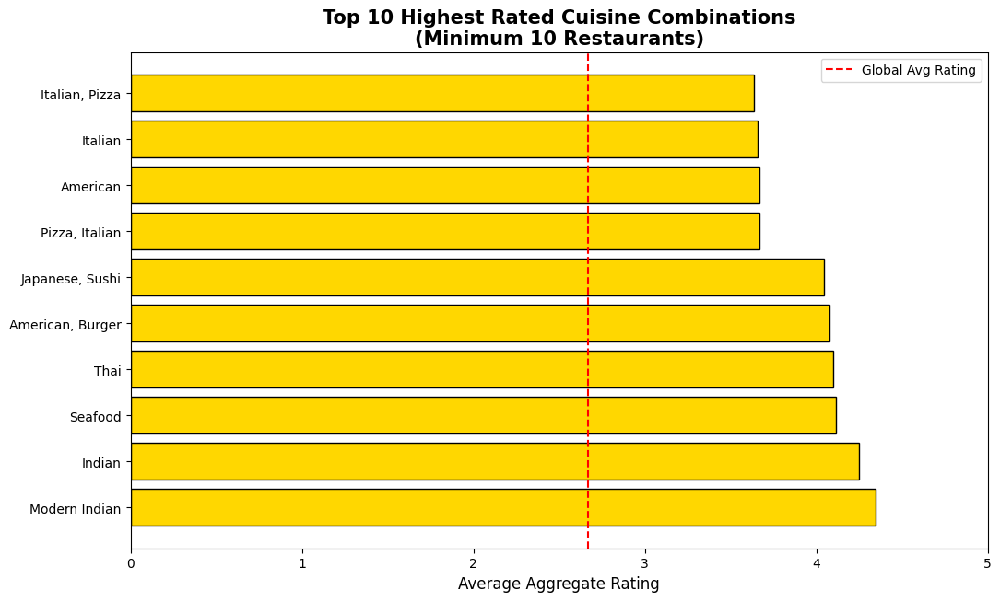

Highest Rated Cuisine Combinations:
Cuisines
Modern Indian       4.345455
Indian              4.250000
Seafood             4.114286
Thai                4.100000
American, Burger    4.076923
Japanese, Sushi     4.044444
Pizza, Italian      3.668421
American            3.667742
Italian             3.657407
Italian, Pizza      3.637500
Name: Average Rating, dtype: float64


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Group by Cuisine Combination and calculate mean rating and count
# We only look at combinations that appear at least 10 times to avoid "lucky" high ratings
combo_stats = df.groupby('Cuisines').agg({'Aggregate rating': 'mean', 'Restaurant ID': 'count'})
combo_stats.columns = ['Average Rating', 'Count']

# Filter for combinations appearing more than 10 times
popular_combos = combo_stats[combo_stats['Count'] > 10].sort_values(by='Average Rating', ascending=False)

# 2. Visualization: Top 10 Highest Rated Combinations
plt.figure(figsize=(12, 7))
top_10_rated = popular_combos.head(10)

plt.barh(top_10_rated.index, top_10_rated['Average Rating'], color='gold', edgecolor='black')

# Add a vertical line for the global average rating to compare
plt.axvline(df['Aggregate rating'].mean(), color='red', linestyle='--', label='Global Avg Rating')

plt.title('Top 10 Highest Rated Cuisine Combinations\n(Minimum 10 Restaurants)', fontsize=15, fontweight='bold')
plt.xlabel('Average Aggregate Rating', fontsize=12)
plt.xlim(0, 5) # Ratings are out of 5
plt.legend()

plt.show()

print("Highest Rated Cuisine Combinations:")
print(top_10_rated['Average Rating'])

# **Geographic Analysis**

In [ ]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# 1. Load the data
df = pd.read_csv('/Dataset .csv')

# 2. Initialize a map centered at a global average location
# We drop rows with missing coordinates first
map_df = df.dropna(subset=['Latitude', 'Longitude'])
m = folium.Map(location=[map_df['Latitude'].mean(), map_df['Longitude'].mean()], zoom_start=2)

# 3. Add markers using a Cluster plugin
# (This prevents the map from lagging by grouping nearby restaurants)
marker_cluster = MarkerCluster().add_to(m)

# Add a limit of 1000 points to keep the map fast in VS Code,
# or remove [:1000] to plot everything
for idx, row in map_df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']} (Rating: {row['Aggregate rating']})",
    ).add_to(marker_cluster)

# 4. Save and display
m.save('restaurant_map.html')
print("Map has been saved as 'restaurant_map.html'. Open this file in your browser to see it!")
m

Map has been saved as 'restaurant_map.html'. Open this file in your browser to see it!


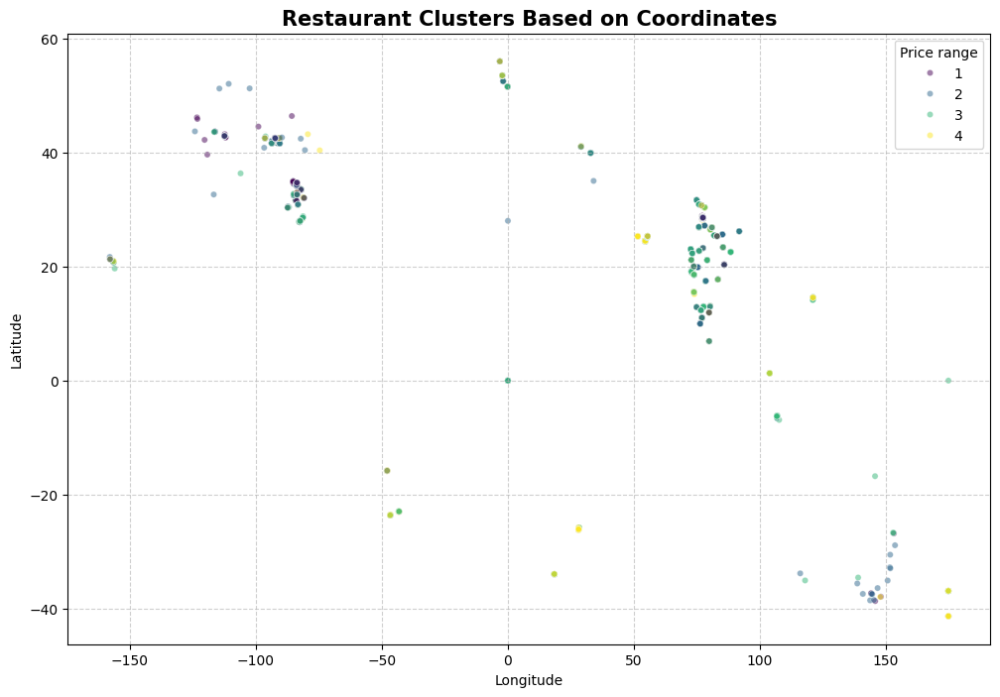

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load the data
df = pd.read_csv('/Dataset .csv')

# 2. Create a Scatter Plot of Latitude vs Longitude
plt.figure(figsize=(12, 8))

# We use 'alpha=0.5' to make dots semi-transparent.
# Darker areas indicate where many restaurants overlap (clusters).
sns.scatterplot(x='Longitude', y='Latitude', data=df,
                hue='Price range', palette='viridis', alpha=0.5, s=20)

plt.title('Restaurant Clusters Based on Coordinates', fontsize=15, fontweight='bold')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, linestyle='--', alpha=0.6)

# 3. Focus on a specific region (Optional)
# If your data is mostly in one country, you can uncomment these to zoom in:
# plt.xlim(60, 100) # Longitude range for India
# plt.ylim(5, 40)   # Latitude range for India

plt.show()

# **Restaurant Chains**

/tmp/ipython-input-1433968414.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('Set3')(range(10))


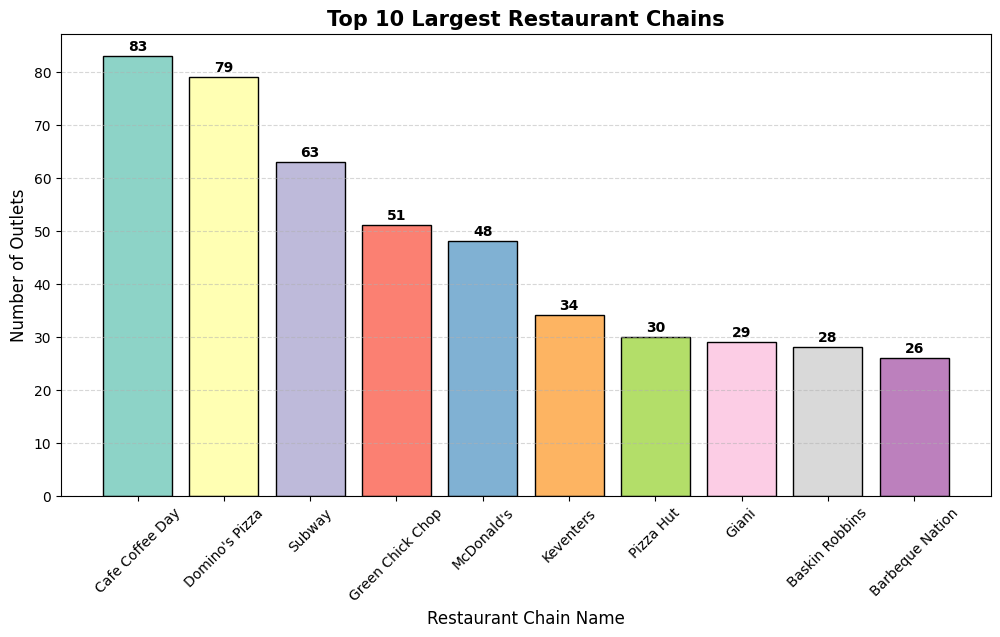

Total number of restaurant chains identified: 734


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('/Dataset .csv')

# 1. Count occurrences of each restaurant name
restaurant_counts = df['Restaurant Name'].value_counts()

# 2. Identify chains (names that appear more than 1 time)
chains = restaurant_counts[restaurant_counts > 1]

# 3. Get the top 10 biggest chains for visualization
top_10_chains = chains.head(10)

# 4. Create an eye-catching Bar Chart
plt.figure(figsize=(12, 6))
colors = plt.cm.get_cmap('Set3')(range(10))

bars = plt.bar(top_10_chains.index, top_10_chains.values, color=colors, edgecolor='black')

# Add count labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, int(yval), ha='center', va='bottom', fontweight='bold')

plt.title('Top 10 Largest Restaurant Chains', fontsize=15, fontweight='bold')
plt.xlabel('Restaurant Chain Name', fontsize=12)
plt.ylabel('Number of Outlets', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()

print(f"Total number of restaurant chains identified: {len(chains)}")

/tmp/ipython-input-3340493936.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_rating['Aggregate rating'], y=top_10_rating.index,
/tmp/ipython-input-3340493936.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_votes['Votes'], y=top_10_votes.index,


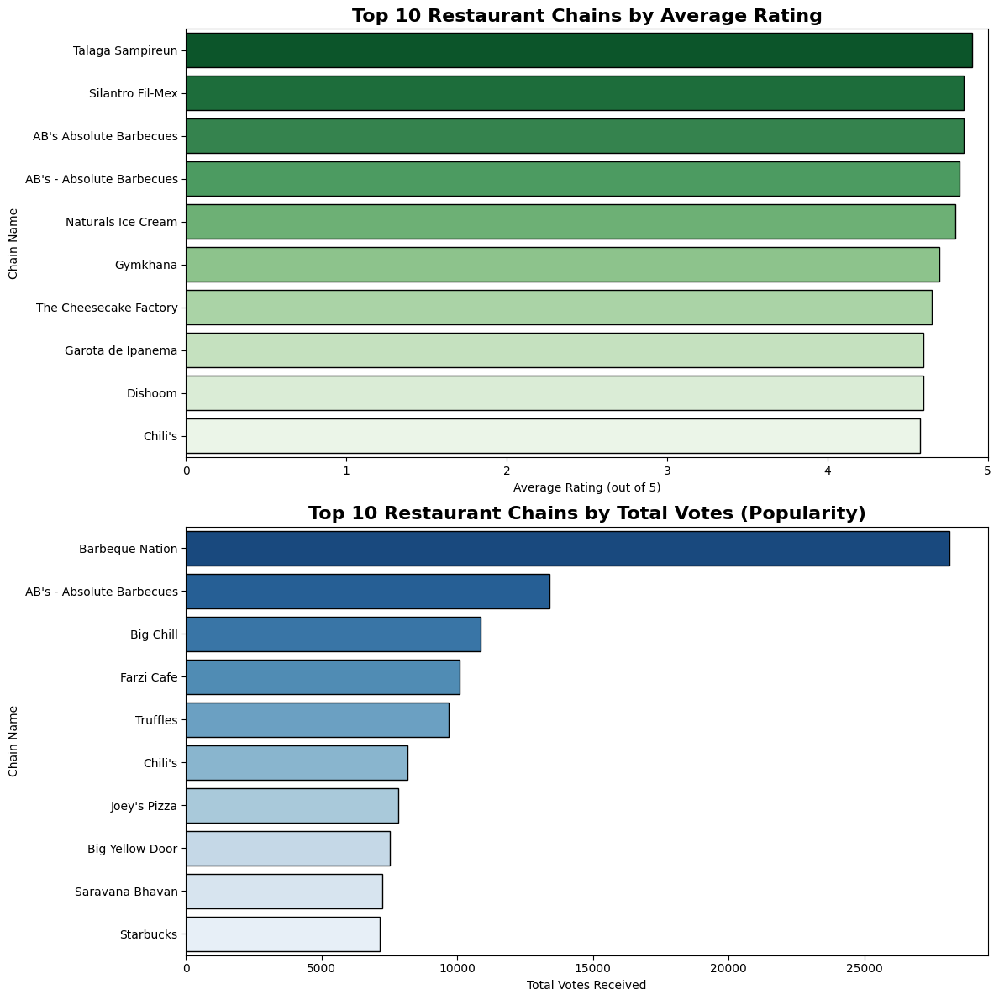

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load the data
df = pd.read_csv('/Dataset .csv')

# 2. Identify chains and calculate stats
# We group by name and get the average rating and total sum of votes
chain_stats = df.groupby('Restaurant Name').agg({
    'Aggregate rating': 'mean',
    'Votes': 'sum',
    'Restaurant ID': 'count'
}).rename(columns={'Restaurant ID': 'Outlet_Count'})

# Filter for chains only (at least 2 outlets)
chains = chain_stats[chain_stats['Outlet_Count'] > 1]

# 3. Get Top 10 by Rating and Top 10 by Votes
top_10_rating = chains.sort_values(by='Aggregate rating', ascending=False).head(10)
top_10_votes = chains.sort_values(by='Votes', ascending=False).head(10)

# 4. Create the Visualizations
plt.figure(figsize=(12, 12))

# Graph 1: Top 10 chains by Average Rating (Quality)
plt.subplot(2, 1, 1)
sns.barplot(x=top_10_rating['Aggregate rating'], y=top_10_rating.index,
            palette='Greens_r', edgecolor='black')
plt.title('Top 10 Restaurant Chains by Average Rating', fontsize=16, fontweight='bold')
plt.xlabel('Average Rating (out of 5)')
plt.ylabel('Chain Name')
plt.xlim(0, 5) # Rating scale is 0-5

# Graph 2: Top 10 restaurant chains by Total Votes (Popularity)
plt.subplot(2, 1, 2)
sns.barplot(x=top_10_votes['Votes'], y=top_10_votes.index,
            palette='Blues_r', edgecolor='black')
plt.title('Top 10 Restaurant Chains by Total Votes (Popularity)', fontsize=16, fontweight='bold')
plt.xlabel('Total Votes Received')
plt.ylabel('Chain Name')

plt.tight_layout()
plt.show()

# **Restaurant Reviews**

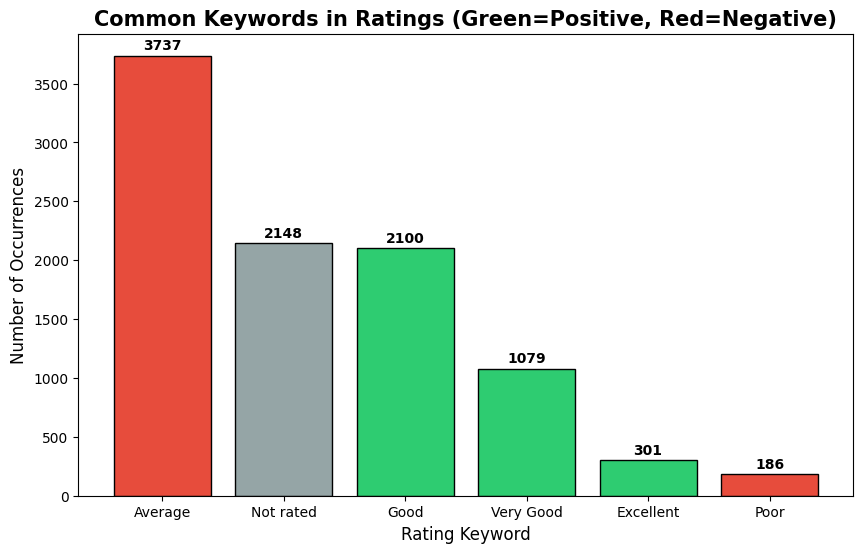

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv('/Dataset .csv')

# 1. Count the occurrences of each sentiment label
sentiment_counts = df['Rating text'].value_counts()

# 2. Separate them into Positive and Negative categories for analysis
# (Based on the dataset values)
positive_keywords = ['Excellent', 'Very Good', 'Good']
negative_keywords = ['Poor', 'Average'] # 'Not rated' is usually neutral

# 3. Create the Visualization
plt.figure(figsize=(10, 6))
colors = ['#2ecc71' if x in positive_keywords else '#e74c3c' if x in negative_keywords else '#95a5a6'
          for x in sentiment_counts.index]

bars = plt.bar(sentiment_counts.index, sentiment_counts.values, color=colors, edgecolor='black')

plt.title('Common Keywords in Ratings (Green=Positive, Red=Negative)', fontsize=15, fontweight='bold')
plt.xlabel('Rating Keyword', fontsize=12)
plt.ylabel('Number of Occurrences', fontsize=12)

# Add counts on top
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 50, int(yval), ha='center', fontweight='bold')

plt.show()

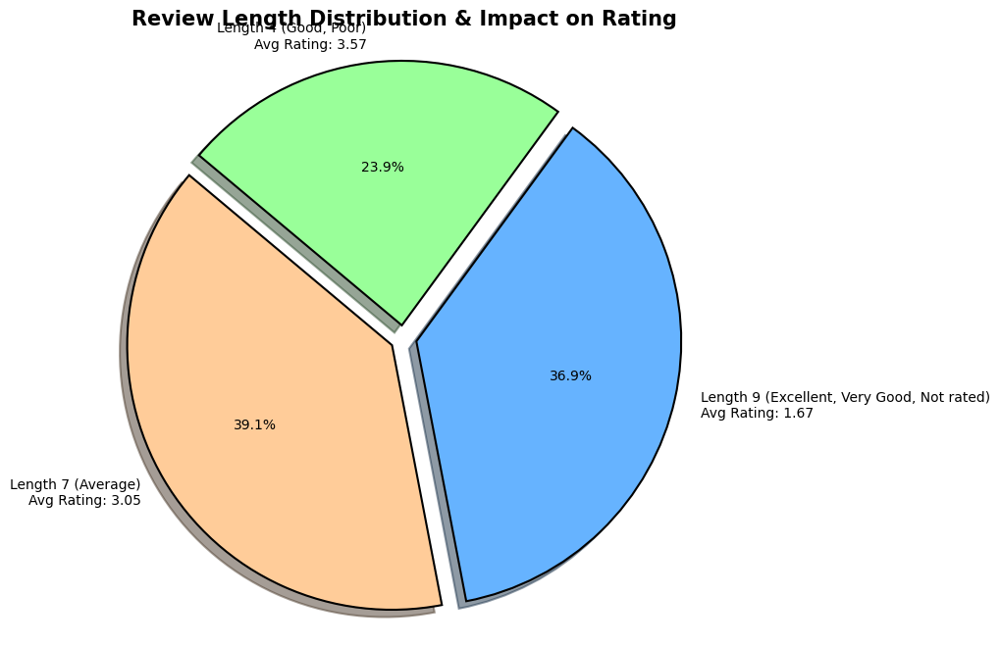

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load the data
df = pd.read_csv('/Dataset .csv')

# 2. Calculate the length of the 'Rating text'
df['Review_Length'] = df['Rating text'].apply(len)

# 3. Count how many restaurants fall into each length category
length_counts = df['Review_Length'].value_counts()

# 4. Calculate average rating for each length group (to show relationship)
avg_rating_per_length = df.groupby('Review_Length')['Aggregate rating'].mean()

# 5. Create labels that show: Length, Keywords, and the Average Rating
labels = []
for length in length_counts.index:
    keywords = df[df['Review_Length'] == length]['Rating text'].unique()
    avg_r = avg_rating_per_length[length]
    labels.append(f"Length {length} ({', '.join(keywords)})\nAvg Rating: {avg_r:.2f}")

# 6. Create an eye-catching Pie Chart
plt.figure(figsize=(10, 8))
colors = ['#ffcc99', '#66b3ff', '#99ff99']
explode = (0.05, 0.05, 0.05) # Separate all slices slightly

plt.pie(length_counts, labels=labels, autopct='%1.1f%%',
        startangle=140, colors=colors, explode=explode, shadow=True,
        wedgeprops={'edgecolor': 'black', 'linewidth': 1.5})

plt.title('Review Length Distribution & Impact on Rating', fontsize=15, fontweight='bold')
plt.axis('equal')

plt.show()

# **Votes Analysis**

Restaurant with highest votes: Toit (10934 votes)
Lowest number of votes is 0. Total restaurants with this count: 1094


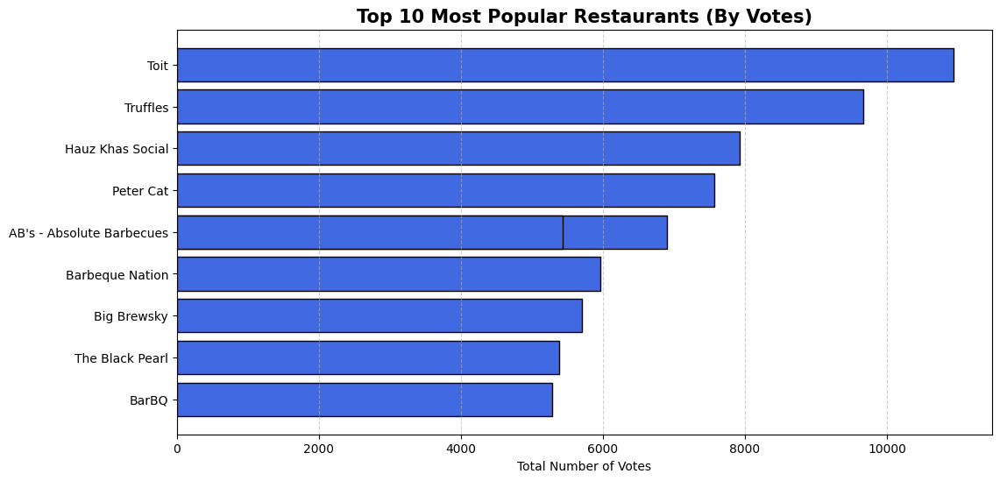

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv('/Dataset .csv')

# 1. Find the restaurant with the HIGHEST number of votes
highest_votes = df.nlargest(1, 'Votes')[['Restaurant Name', 'Votes']]

# 2. Find the restaurant(s) with the LOWEST number of votes
# Note: Many restaurants might have 0 votes
lowest_votes_value = df['Votes'].min()
lowest_votes_count = df[df['Votes'] == lowest_votes_value].shape[0]

print(f"Restaurant with highest votes: {highest_votes.iloc[0]['Restaurant Name']} ({highest_votes.iloc[0]['Votes']} votes)")
print(f"Lowest number of votes is {lowest_votes_value}. Total restaurants with this count: {lowest_votes_count}")

# 3. Visualization: Top 10 Most Voted Restaurants
top_10_voted = df.nlargest(10, 'Votes')

plt.figure(figsize=(12, 6))
plt.barh(top_10_voted['Restaurant Name'], top_10_voted['Votes'], color='royalblue', edgecolor='black')
plt.gca().invert_yaxis() # Highest at the top
plt.title('Top 10 Most Popular Restaurants (By Votes)', fontsize=15, fontweight='bold')
plt.xlabel('Total Number of Votes')
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.show()

The Correlation Coefficient between Votes and Rating is: 0.31


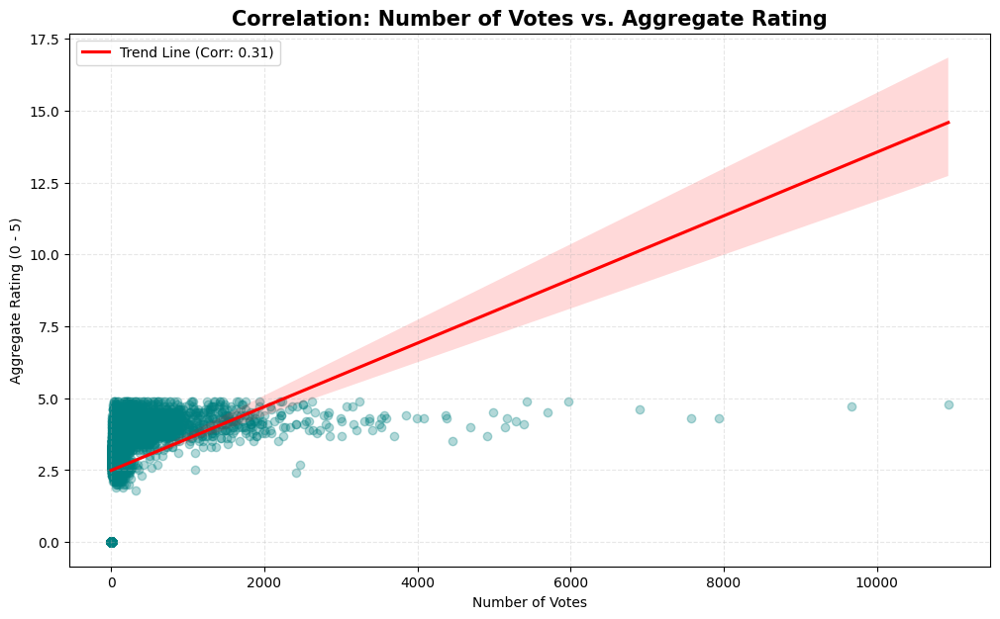

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Calculate the Correlation Coefficient
# 1 = perfect positive correlation, 0 = no correlation, -1 = perfect negative
correlation = df['Votes'].corr(df['Aggregate rating'])
print(f"The Correlation Coefficient between Votes and Rating is: {correlation:.2f}")

# 2. Visualization: Regression Plot
plt.figure(figsize=(12, 7))
sns.regplot(x='Votes', y='Aggregate rating', data=df,
            scatter_kws={'alpha':0.3, 'color':'teal'},
            line_kws={'color':'red', 'label':f'Trend Line (Corr: {correlation:.2f})'})

plt.title('Correlation: Number of Votes vs. Aggregate Rating', fontsize=15, fontweight='bold')
plt.xlabel('Number of Votes')
plt.ylabel('Aggregate Rating (0 - 5)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)

plt.show()

# Price Range vs. Online Delivery and
# Table Booking

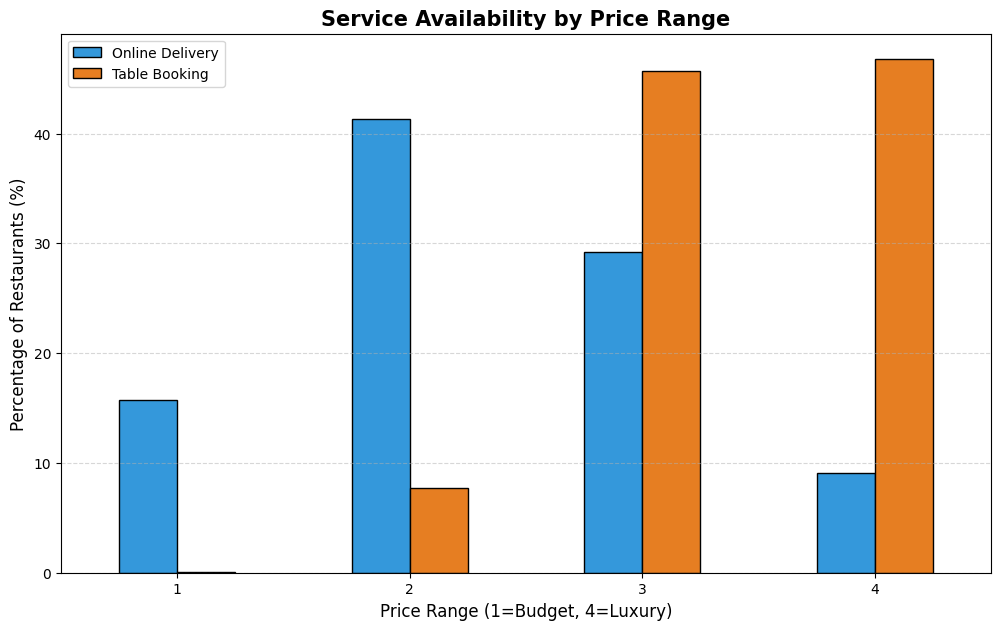

Percentage of services available per Price Range:
             Online_Delivery_Binary  Table_Booking_Binary
Price range                                              
1                         15.774077              0.022502
2                         41.310633              7.677482
3                         29.190341             45.738636
4                          9.044369             46.757679


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv('/Dataset .csv')

# Convert 'Yes'/'No' to 1/0 to calculate percentages easily
df['Online_Delivery_Binary'] = df['Has Online delivery'].map({'Yes': 1, 'No': 0})
df['Table_Booking_Binary'] = df['Has Table booking'].map({'Yes': 1, 'No': 0})

# Group by Price Range and calculate the mean (percentage)
service_relationship = df.groupby('Price range')[['Online_Delivery_Binary', 'Table_Booking_Binary']].mean() * 100

# Visualization
plt.figure(figsize=(12, 7))
service_relationship.plot(kind='bar', color=['#3498db', '#e67e22'], edgecolor='black', ax=plt.gca())

plt.title('Service Availability by Price Range', fontsize=15, fontweight='bold')
plt.xlabel('Price Range (1=Budget, 4=Luxury)', fontsize=12)
plt.ylabel('Percentage of Restaurants (%)', fontsize=12)
plt.xticks(rotation=0)
plt.legend(['Online Delivery', 'Table Booking'], loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()

print("Percentage of services available per Price Range:")
print(service_relationship)

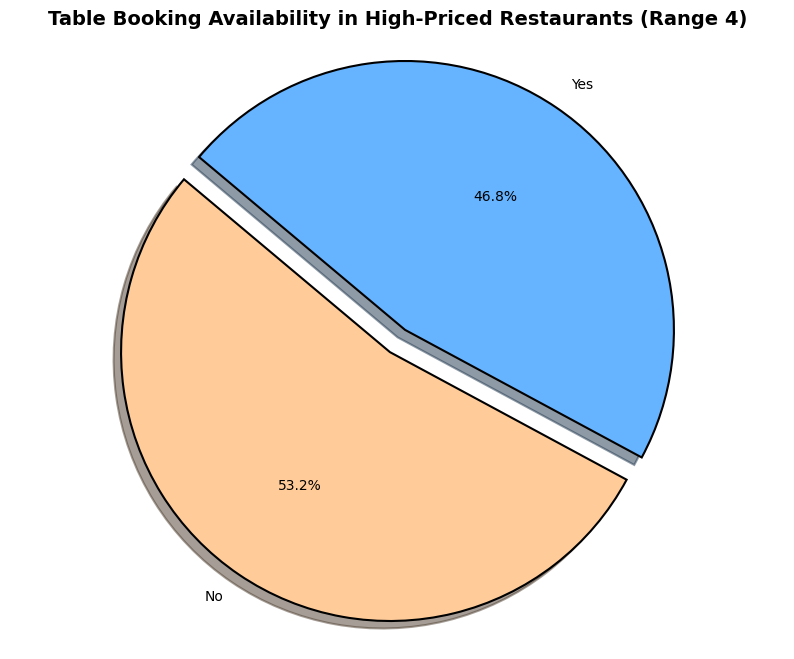

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load the data
df = pd.read_csv('/Dataset .csv')

# 2. Filter for only the highest price range (4)
price_4_restaurants = df[df['Price range'] == 4]

# 3. Count 'Has Table booking' for these luxury restaurants
table_booking_counts = price_4_restaurants['Has Table booking'].value_counts()

# 4. Create the Pie Chart
plt.figure(figsize=(10, 8))
colors = ['#ffcc99', '#66b3ff'] # Soft orange and blue
explode = (0.1, 0) # Pop out the 'Yes' slice

plt.pie(table_booking_counts,
        labels=table_booking_counts.index,
        autopct='%1.1f%%',
        startangle=140,
        colors=colors,
        explode=explode,
        shadow=True,
        wedgeprops={'edgecolor': 'black', 'linewidth': 1.5})

plt.title('Table Booking Availability in High-Priced Restaurants (Range 4)',
          fontsize=14, fontweight='bold')

plt.axis('equal')
plt.show()